# Aerial Image Classification

#### Matthew Peach

In [9]:
import tensorflow as tf

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os
import numpy as np
from sklearn.cluster import KMeans

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
import seaborn as sns
from sklearn.svm import SVC

In [2]:
print("Number of GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
tf.test.is_built_with_cuda()

Number of GPUs Available:  1


True

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os
import numpy as np
from sklearn.cluster import KMeans

# Set root directory as the current working directory
PROJECT_ROOT_DIR = "."

## Loading an Image

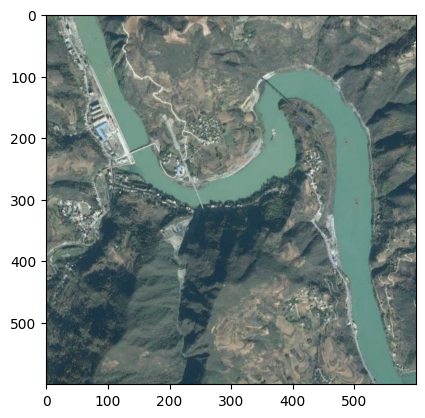

In [4]:
images_path = os.path.join(PROJECT_ROOT_DIR, "AID")
filename = "River\\river_39.jpg"

image = imread(os.path.join(images_path, filename))

plt.imshow(image)

## Color Segmentation with KMeans Clustering

In [5]:
%%time

X = image.reshape(-1,3)

segmented_imgs = []
n_colors = (10, 8, 6, 4, 2)
for n_clusters in n_colors:
    kmeans = KMeans(n_clusters = n_clusters, n_init = 10, random_state = 23).fit(X)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    segmented_imgs.append(segmented_img.reshape(image.shape))

CPU times: total: 5min 32s
Wall time: 15.6 s


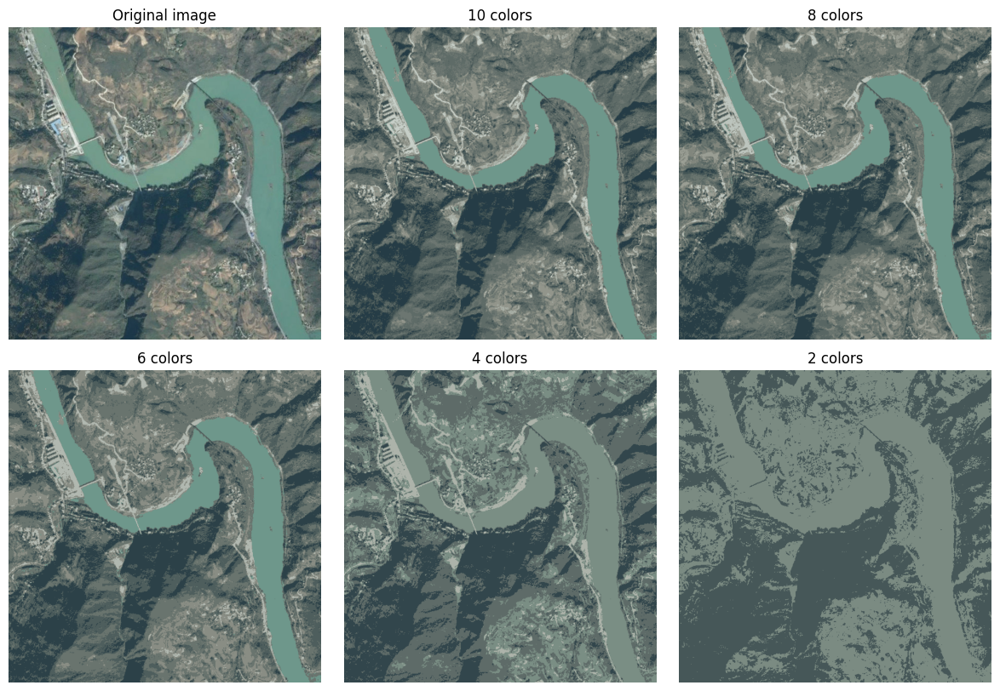

In [6]:
plt.figure(figsize=(15,10))
plt.subplots_adjust(wspace=0.05, hspace=0.1)

plt.subplot(231)
plt.imshow(image)
plt.title("Original image")
plt.axis('off')

for idx, n_clusters in enumerate(n_colors):
    plt.subplot(232 + idx)
    plt.imshow(segmented_imgs[idx].astype("uint8"))
    plt.title("{} colors".format(n_clusters))
    plt.axis('off')

Those all look fairly alike, so I'm going to find an image with a more dynamic color palette.

CPU times: total: 5min 21s
Wall time: 14.3 s


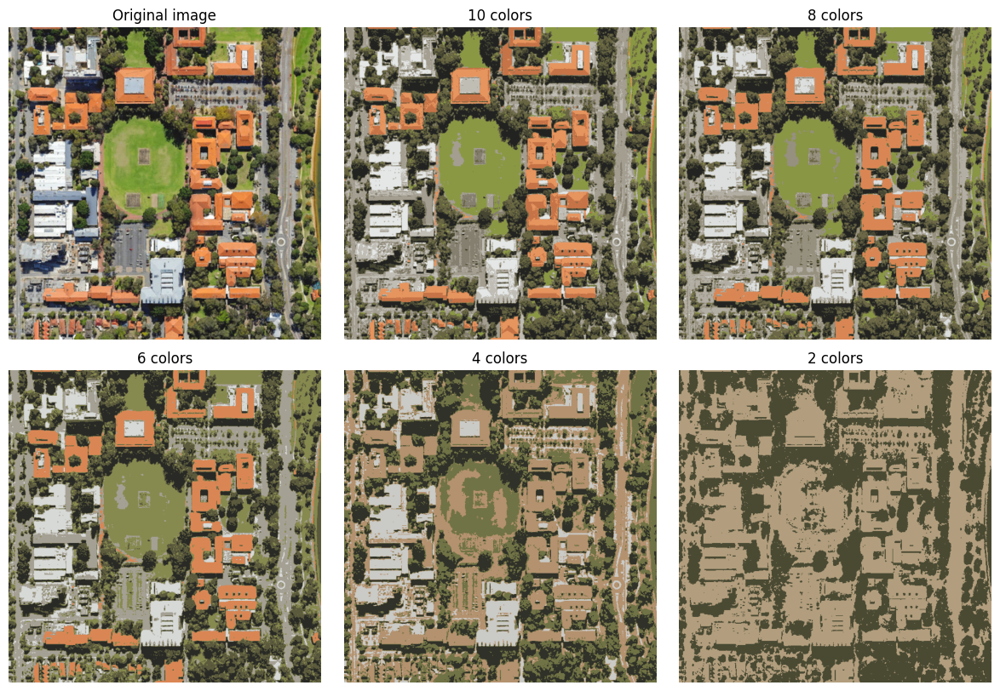

In [7]:
%%time

filename = "School\\school_56.jpg"

image = imread(os.path.join(images_path, filename))


X = image.reshape(-1,3)

segmented_imgs = []
n_colors = (10, 8, 6, 4, 2)
for n_clusters in n_colors:
    kmeans = KMeans(n_clusters = n_clusters, n_init = 10, random_state = 23).fit(X)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    segmented_imgs.append(segmented_img.reshape(image.shape))
    

plt.figure(figsize=(15,10))
plt.subplots_adjust(wspace=0.05, hspace=0.1)

plt.subplot(231)
plt.imshow(image)
plt.title("Original image")
plt.axis('off')

for idx, n_clusters in enumerate(n_colors):
    plt.subplot(232 + idx)
    # I followed the textbook example, but this line requires .astype("uint8") to avoid errors.
    plt.imshow(segmented_imgs[idx].astype("uint8"))
    plt.title("{} colors".format(n_clusters))
    plt.axis('off')

In [8]:
class ImageData:
    
    def __init__(self):
        self.data = []
        self.colorSegmentFeatures = []
        self.pictures = []
    
    
    def addImageClass(self, label, count):
        # Set the directory
        images_path = os.path.join(".\\AID", label.capitalize())
    
        for n in range(1, count + 1):
        
            filename = label.lower().strip() + "_" + str(n) + ".jpg"
        
            image = imread(os.path.join(images_path, filename))
        
            self.data.append([label, filename, image])
            
            
    def printPicture(self, pictureIndex):
        plt.imshow(self.pictures[pictureIndex].astype("uint8"))
            
            
            
    def colorSegmentImages(self):
        
        for i in range(0, len(self.data)):
            
            X = self.data[i][2].reshape(-1,3)
            kmeans = KMeans(n_clusters = 4, n_init = 10, random_state = 23)
            kmeans.fit(X)
            
            segmentedImage = kmeans.cluster_centers_[kmeans.labels_].reshape(600,600,3)
            self.pictures.append(segmentedImage)
            
            # The color counts
            colorCounts = np.unique(kmeans.labels_, return_counts = True)[1]
            # RGB values of these colors
            colorValues = kmeans.cluster_centers_
            
            # Sort both above arrays based on color counts
            zipped = list(zip(colorCounts, colorValues))
            zippedSorted = sorted(zipped, key = lambda x: x[0])
            colorCounts_Sorted, colorValues_Sorted = zip(*zippedSorted)
             
            count_RGB = []
            
            for j in range(0, len (colorCounts_Sorted)):
                
                count_RGB.append(colorCounts_Sorted[j])
                # red
                count_RGB.append(colorValues_Sorted[j][0])
                # green
                count_RGB.append(colorValues_Sorted[j][1])
                # blue
                count_RGB.append(colorValues_Sorted[j][2])
                
            
            # A bit odd, but I know I'd like to use 50 samples, so using % 50 to get the right numbering
            self.colorSegmentFeatures.append([self.data[i][0], self.data[i][0] + "_" + str(int(len(self.pictures) % 50)) + ".png", 
                                              count_RGB])
            

## Selecting some Images

In [ ]:
%%time
imageData = ImageData()

imageData.addImageClass("MediumResidential", 50)
imageData.addImageClass("DenseResidential", 50)
imageData.addImageClass("Parking", 50)
imageData.addImageClass("Forest", 50)
imageData.addImageClass("Beach", 50)
imageData.addImageClass("Desert", 50)

In [ ]:
%%time 

imageData.colorSegmentImages()

In [ ]:
df = pd.DataFrame(imageData.colorSegmentFeatures)
dfClean = pd.DataFrame(imageData.colorSegmentFeatures)

## Unpacking Column 2 (Colors)

In [ ]:
newColumns = pd.DataFrame(df[2].to_list())
df = pd.DataFrame(pd.concat([df, newColumns], axis = 1))

In [ ]:
df.info()
df.head()

There's still a lot wrong here. The column names must be fixed as well as dropping a few columns.

In [ ]:
df.columns = ["Label", "File", "DropThis", 
              "Color1_Freq", "Red1", "Green1", "Blue1",
              "Color2_Freq", "Red2", "Green2", "Blue2",
              "Color3_Freq", "Red3", "Green3", "Blue3",
              "Color4_Freq", "Red4", "Green4", "Blue4"]

df.head()

In [ ]:
df = df.drop("DropThis", axis = 1)

# Going ahead and fixing these file names too
df["File"] = df["File"].replace({"MediumResidential_0.png": "MediumResidential_50.png",
                                "DenseResidential_0.png": "DenseResidential_50.png",
                                "Forest_0.png": "Forest_50.png",
                                "Parking_0.png": "Parking_50.png",
                                "Beach_0.png": "Beach_50.png",
                                "Desert_0.png": "Desert_50.png"})

## Saving a Cleaned DataFrame
(So that every image doesn't have to be color segmented again)

#### (Notebook may be started from here to avoid waiting for images to segment)

In [ ]:
df.to_csv("colorSegmentedImages.csv", index = False)

In [ ]:
df = pd.read_csv("colorSegmentedImages.csv")

These column names are not good. There were even repeating column names before loading from the csv - this has to be fixed.

## An initial model with a Random Forest

In [ ]:
from sklearn.model_selection import train_test_split

features = ["Color1_Freq", "Red1", "Green1", "Blue1",
              "Color2_Freq", "Red2", "Green2", "Blue2",
              "Color3_Freq", "Red3", "Green3", "Blue3",
              "Color4_Freq", "Red4", "Green4", "Blue4"]

X = df[features]
y = df["Label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 93, test_size = 0.2, stratify = y)

In [ ]:
%%time

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

randomForest = RandomForestClassifier(random_state = 93)
randomForest.fit(X_train, y_train)
y_pred = randomForest.predict(X_test)
print(classification_report(y_pred, y_test))

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

confusionMatrix = confusion_matrix(y_test, y_pred)
cm = ConfusionMatrixDisplay(confusion_matrix = confusionMatrix)
cm.plot(cmap = "viridis")
plt.show()

- 0 = Beach
- 1 = Dense Residential
- 2 = Desert
- 3 = Forest
- 4 = Medium Residential
- 5 = Parking

## Feature Importances

In [ ]:
importances = pd.Series(randomForest.feature_importances_, index = X.columns).sort_values()

fig, ax = plt.subplots(figsize = (12, 12))

importances.plot.barh(ax = ax, color = "ivory")
ax.grid(True)
ax.set_facecolor("peru")

## Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "n_estimators": [50, 100, 150, 200],
    "min_samples_split": [2, 4, 6],
    "max_features": ["log2", "sqrt"],
    "bootstrap": [True, False],
    "warm_start": [True, False]
}


tuner = GridSearchCV(estimator = randomForest, param_grid = param_grid, cv = 5)
tuner.fit(X_train, y_train)

In [ ]:
tuner.best_params_

In [ ]:
tuned_rf = RandomForestClassifier(random_state = 93, bootstrap = True, max_features = "log2", 
                                  min_samples_split = 4, n_estimators = 150, warm_start = True)

tuned_rf.fit(X_train, y_train)
tuned_y_pred = tuned_rf.predict(X_test)
print(classification_report(tuned_y_pred, y_test))

In [ ]:
confusionMatrix = confusion_matrix(y_test, tuned_y_pred)
cm = ConfusionMatrixDisplay(confusion_matrix = confusionMatrix)
cm.plot(cmap = "viridis")
plt.show()

Nothing changed - maybe I have too few samples?

In [ ]:
import seaborn as sns

plt.figure(figsize = (10, 10))
sns.heatmap(X.corr(), annot = True)

## Trying with more samples.

That seemed a bit *too* easy, so let's try with more samples to make sure it wasn't just luck.

### Turning "ImageData" into "ColorSegmenter"

The original ImageData class stores every pixel of every picture in an array. I worry that this is excessive. As long as the file name is recorded then color segmentation can just be performed on that image to see what it looks like.

In [ ]:
class ColorSegmenter:
    
    def __init__(self):
        self.data = []
        self.colorSegmentFeatures = []
    
    
    def addImageClass(self, label, count):
        # Set the directory
        images_path = os.path.join(".\\AID", label.capitalize())
    
        for n in range(1, count + 1):
            filename = label.lower().strip() + "_" + str(n) + ".jpg"
            image = imread(os.path.join(images_path, filename))
        
            X = image.reshape(-1,3)
            kmeans = KMeans(n_clusters = 4, n_init = 10, random_state = 23)
            kmeans.fit(X)
            
            # The color counts
            colorCounts = np.unique(kmeans.labels_, return_counts = True)[1]
            # RGB values of these colors
            colorValues = kmeans.cluster_centers_
            
            # Sort both above arrays based on color counts
            zipped = list(zip(colorCounts, colorValues))
            zippedSorted = sorted(zipped, key = lambda x: x[0])
            colorCounts_Sorted, colorValues_Sorted = zip(*zippedSorted)
            
            count_RGB = []
            
            for i in range(0, len (colorCounts_Sorted)):
                
                count_RGB.append(colorCounts_Sorted[i])
                # red
                count_RGB.append(colorValues_Sorted[i][0])
                # green
                count_RGB.append(colorValues_Sorted[i][1])
                # blue
                count_RGB.append(colorValues_Sorted[i][2])
                
                
            self.colorSegmentFeatures.append([label, filename, count_RGB])

In [ ]:
%%time
colorSegmenter = ColorSegmenter()

colorSegmenter.addImageClass("MediumResidential", 200)
colorSegmenter.addImageClass("DenseResidential", 200)
colorSegmenter.addImageClass("Parking", 200)
colorSegmenter.addImageClass("Forest", 200)
colorSegmenter.addImageClass("Beach", 200)
colorSegmenter.addImageClass("Desert", 200)

## Saving a cleaned DataFrame (again)
(I use a lot of intermediate dataframes here because I am afraid of having to run the above cell again)

In [ ]:
df2 = pd.DataFrame(colorSegmenter.colorSegmentFeatures)
df2.info()
df2.head()

In [ ]:
newColumns = pd.DataFrame(df2[2].to_list())
dfConcat = pd.DataFrame(pd.concat([df2, newColumns], axis = 1))

In [ ]:
dfConcat.columns = ["Label", "File", "DropThis", 
              "Color1_Freq", "Red1", "Green1", "Blue1",
              "Color2_Freq", "Red2", "Green2", "Blue2",
              "Color3_Freq", "Red3", "Green3", "Blue3",
              "Color4_Freq", "Red4", "Green4", "Blue4"]

In [ ]:
dfConcat = dfConcat.drop("DropThis", axis = 1)

In [ ]:
dfConcat.to_csv("colorSegmentedImages_Improved.csv", index = False)

## Loading the Improved DataFrame from a csv File

In [10]:
df = pd.read_csv("colorSegmentedImages_Improved.csv")

## Training another RandomForest

In [11]:
features = ["Color1_Freq", "Red1", "Green1", "Blue1",
              "Color2_Freq", "Red2", "Green2", "Blue2",
              "Color3_Freq", "Red3", "Green3", "Blue3",
              "Color4_Freq", "Red4", "Green4", "Blue4"]

X = df[features]
y = df["Label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 93, test_size = 0.2, stratify = y)

randomForest = RandomForestClassifier(random_state = 93)
randomForest.fit(X_train, y_train)
y_pred = randomForest.predict(X_test)
print(classification_report(y_pred, y_test))

                   precision    recall  f1-score   support

            Beach       0.93      0.84      0.88        44
 DenseResidential       0.93      0.88      0.90        42
           Desert       1.00      1.00      1.00        40
           Forest       0.93      0.93      0.93        40
MediumResidential       0.85      0.81      0.83        42
          Parking       0.78      0.97      0.86        32

         accuracy                           0.90       240
        macro avg       0.90      0.90      0.90       240
     weighted avg       0.90      0.90      0.90       240



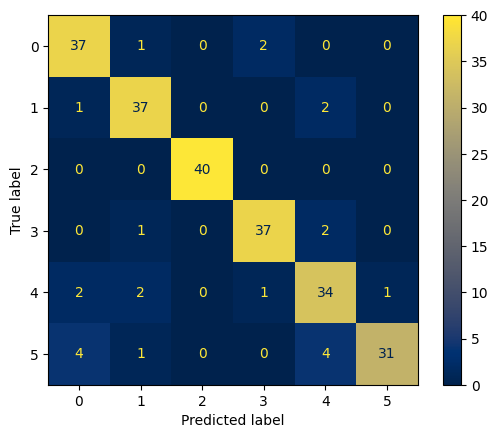

In [12]:
confusionMatrix = confusion_matrix(y_test, y_pred)
cm = ConfusionMatrixDisplay(confusion_matrix = confusionMatrix)
cm.plot(cmap = "cividis")
plt.show()

In [13]:
param_grid = {
    "n_estimators": [50, 100, 150, 200],
    "min_samples_split": [2, 4, 6],
    "max_features": ["log2", "sqrt"],
    "bootstrap": [True, False],
    "warm_start": [True, False]
}

tuner = GridSearchCV(estimator = randomForest, param_grid = param_grid, cv = 5)
tuner.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=93),
             param_grid={'bootstrap': [True, False],
                         'max_features': ['log2', 'sqrt'],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [50, 100, 150, 200],
                         'warm_start': [True, False]})

In [14]:
tuner = GridSearchCV(estimator = randomForest, param_grid = param_grid, cv = 5)
tuner.fit(X_train, y_train)
tuner.best_params_

{'bootstrap': False,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 100,
 'warm_start': True}

### Hyperparameter Tuning

In [15]:
randomForest = RandomForestClassifier(random_state = 93, bootstrap = False, max_features = "log2", 
                                      min_samples_split = 2, n_estimators = 100, warm_start = True)
randomForest.fit(X_train, y_train)
y_pred = randomForest.predict(X_test)
print(classification_report(y_pred, y_test))

                   precision    recall  f1-score   support

            Beach       0.93      0.86      0.89        43
 DenseResidential       0.95      0.93      0.94        41
           Desert       1.00      1.00      1.00        40
           Forest       0.95      0.90      0.93        42
MediumResidential       0.85      0.85      0.85        40
          Parking       0.80      0.94      0.86        34

         accuracy                           0.91       240
        macro avg       0.91      0.91      0.91       240
     weighted avg       0.92      0.91      0.91       240



## Training an SVM

In [16]:
from sklearn.svm import SVC

svc = SVC(random_state = 93)
svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)
print(classification_report(y_pred, y_test))

                   precision    recall  f1-score   support

            Beach       0.23      0.45      0.30        20
 DenseResidential       0.47      0.40      0.43        48
           Desert       0.25      0.42      0.31        24
           Forest       0.62      0.40      0.49        63
MediumResidential       0.53      0.43      0.47        49
          Parking       0.53      0.58      0.55        36

         accuracy                           0.44       240
        macro avg       0.44      0.45      0.43       240
     weighted avg       0.49      0.44      0.45       240



Not a great result compared to the Random Forest. Trying to use GridSearchCV Would not complete in a timely manner with various parameters.

## Trying the Random Forest with new images

In [97]:
def getColorSegmentedInstance(file):
    data = []
    
    test_images_path = os.path.join(".\\Test_Images")
    image = imread(os.path.join(test_images_path, file))
    
    data.append(file)
    
    X = image.reshape(-1,3)
    kmeans = KMeans(n_clusters = 4, n_init = 10, random_state = 23)
    kmeans.fit(X)
            
    # The color counts
    colorCounts = np.unique(kmeans.labels_, return_counts = True)[1]
    # RGB values of these colors
    colorValues = kmeans.cluster_centers_
            
    # Sort both above arrays based on color counts
    zipped = list(zip(colorCounts, colorValues))
    zippedSorted = sorted(zipped, key = lambda x: x[0])
    colorCounts_Sorted, colorValues_Sorted = zip(*zippedSorted)
    
            
    for i in range(0, len (colorCounts_Sorted)):
                
        data.append(colorCounts_Sorted[i])
        # red
        data.append(colorValues_Sorted[i][0])
        # green
        data.append(colorValues_Sorted[i][1])
        # blue
        data.append(colorValues_Sorted[i][2])
    
    plt.figure(figsize = (15,15))
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    segmented_img = segmented_img.reshape(image.shape)
    plt.imshow(segmented_img.astype("uint8"))
    
    data = pd.DataFrame([data])
    data.columns = ["File", "Color1_Freq", "Red1", "Green1", "Blue1",
                        "Color2_Freq", "Red2", "Green2", "Blue2",
                        "Color3_Freq", "Red3", "Green3", "Blue3",
                        "Color4_Freq", "Red4", "Green4", "Blue4"]
    
    return data;

array(['DenseResidential'], dtype=object)

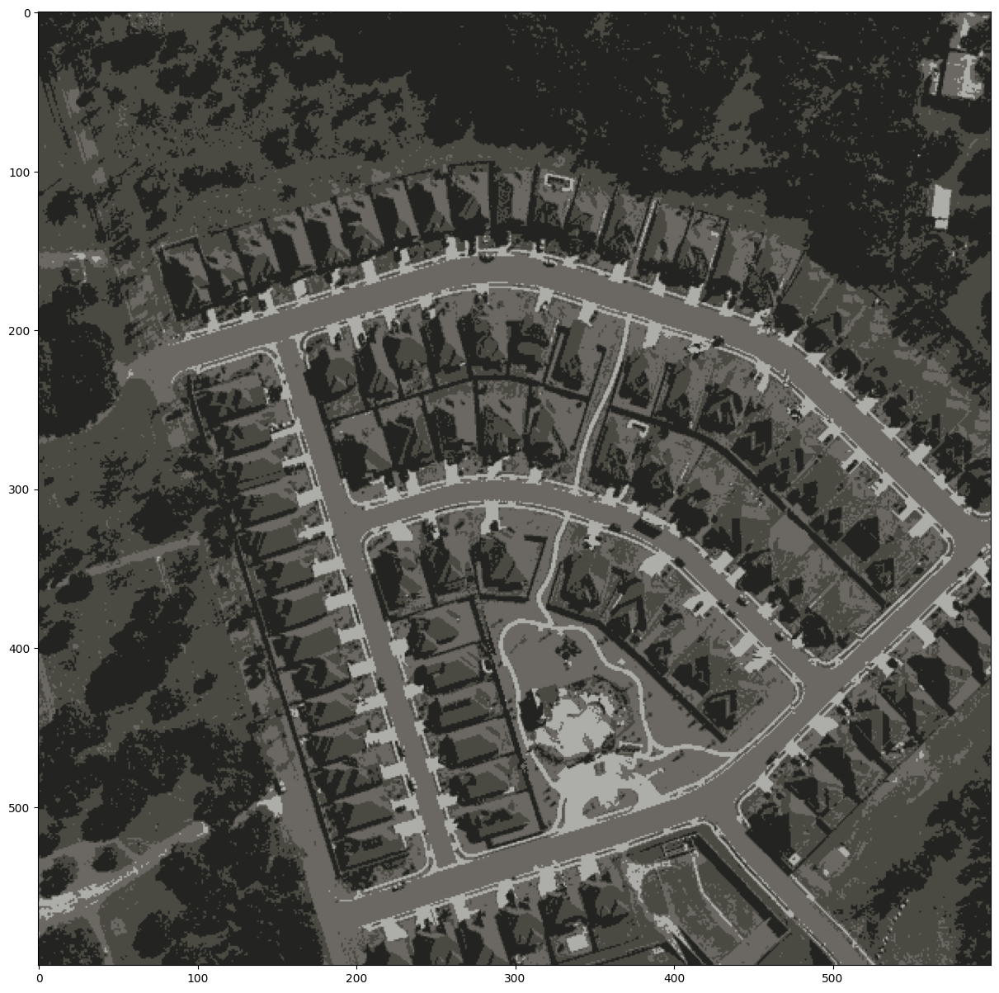

In [98]:
testImage = getColorSegmentedInstance("Home_24.bmp")
randomForest.predict(testImage.drop("File", axis = 1))

array(['Beach'], dtype=object)

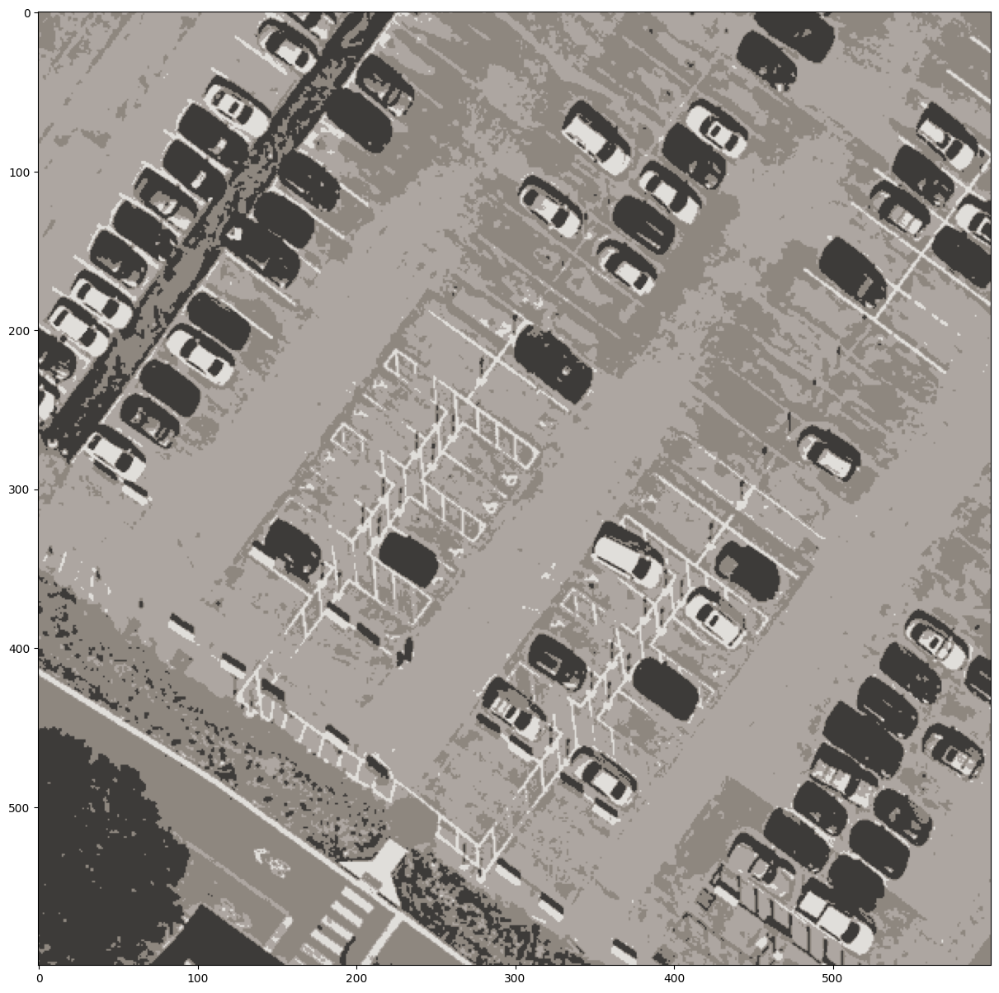

In [99]:
testImage = getColorSegmentedInstance("ACC_Highland_Campus_Parking_24.bmp")
randomForest.predict(testImage.drop("File", axis = 1))

array(['Parking'], dtype=object)

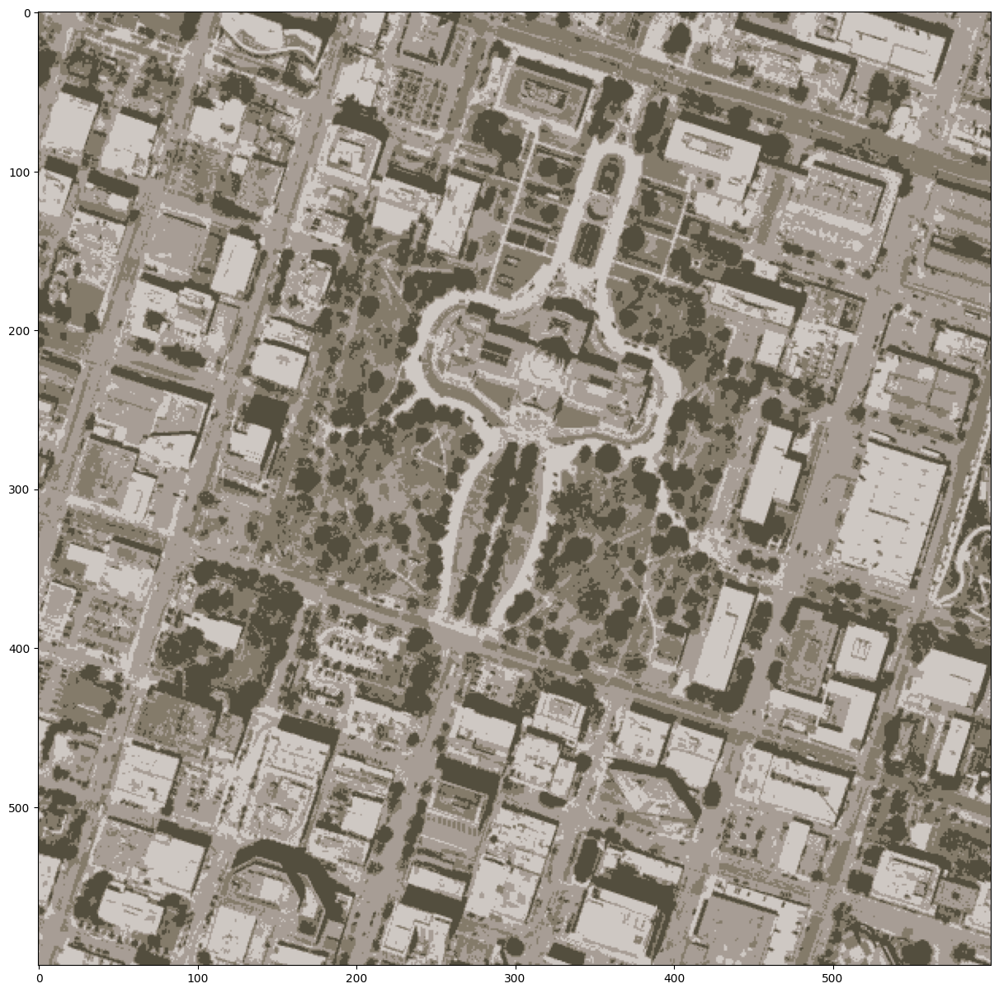

In [100]:
testImage = getColorSegmentedInstance("TX_Capitol.bmp")
randomForest.predict(testImage.drop("File", axis = 1))

array(['Beach'], dtype=object)

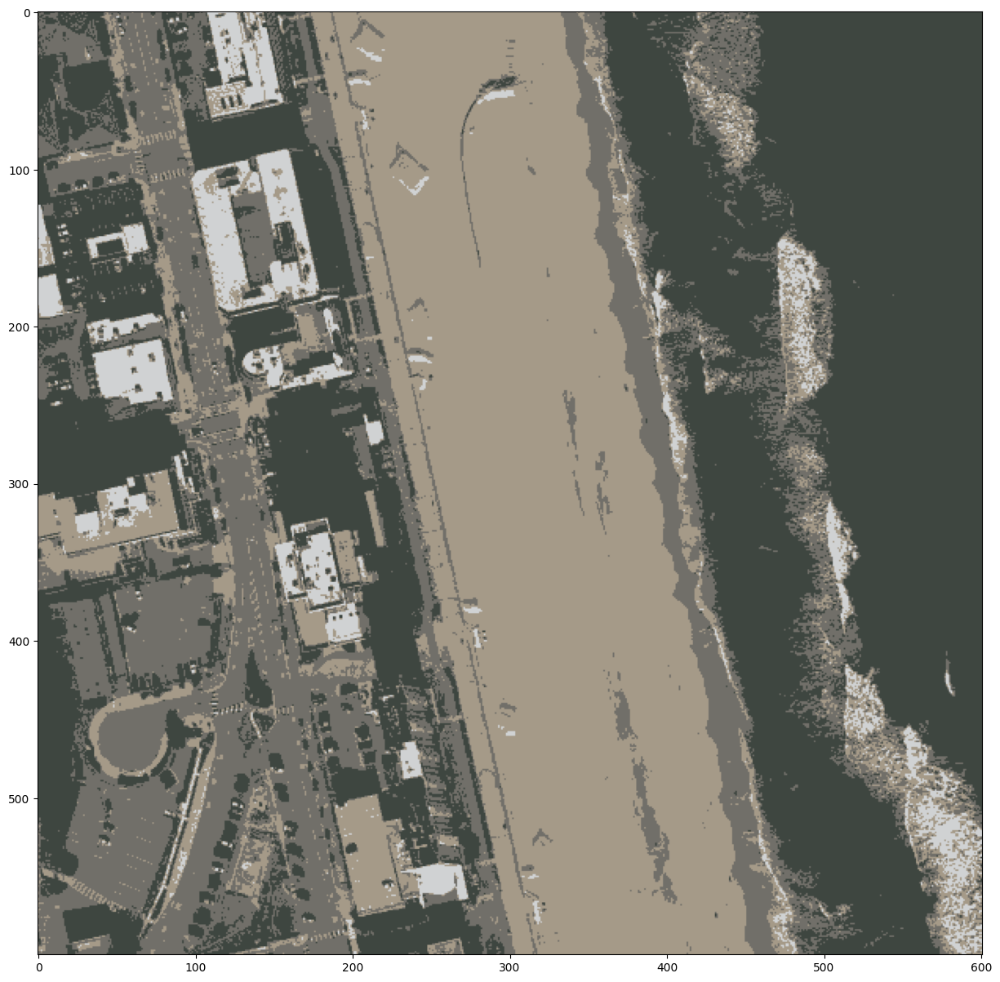

In [101]:
testImage = getColorSegmentedInstance("VA_Beach.bmp")
randomForest.predict(testImage.drop("File", axis = 1))

array(['Forest'], dtype=object)

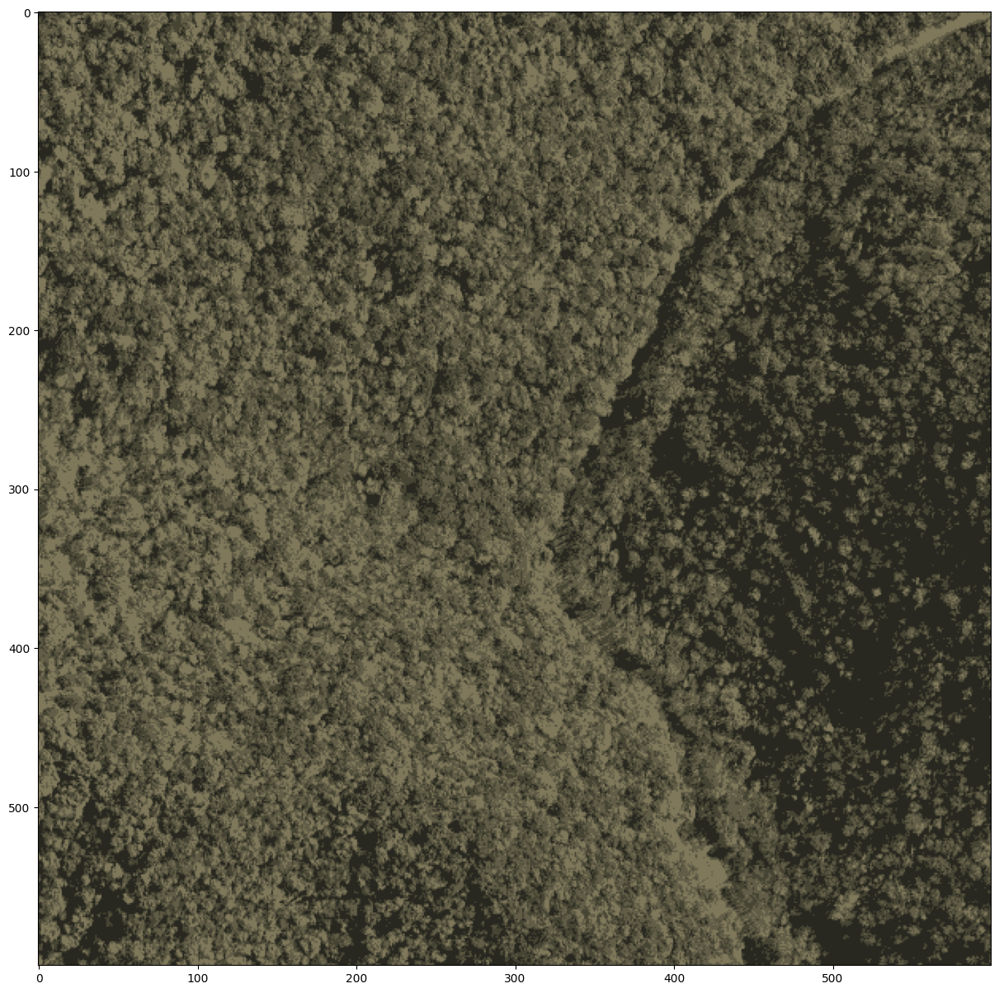

In [102]:
testImage = getColorSegmentedInstance("Nantahala_National_Forest.bmp")
randomForest.predict(testImage.drop("File", axis = 1))

## References

https://captain-whu.github.io/AID/